### **Names of submitters:**
Yarden Mizrahi

Dor Ferenc

## **1.	LAB 1: Filters and Convolutions:**

      1.1.	Conv2d:
      
        1.1.1.1.	Implement conv2d for grayscale images

        1.1.1.2.	Implement conv2d for color Images (RGB). Hint use your grayscale implementation of conv2d per channel.

        1.1.1.3.	Use MSE to compare your results on a RGB image to the result of scipy conv2d


**connect to drive**

In [23]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [24]:
import os
GOOGLE_DRIVE_PATH = '/content/drive/MyDrive/ComputerVision'
print(os.listdir(GOOGLE_DRIVE_PATH))

['img.jpg', 'img1.jpg', 'demo_RGB_image.png', 'img2.jpg']


In [25]:
wd = os.getcwd()
print('before', os.getcwd(), "wd", wd)
os.chdir(GOOGLE_DRIVE_PATH)
print('after', os.getcwd())

before /content/drive/MyDrive/ComputerVision wd /content/drive/MyDrive/ComputerVision
after /content/drive/MyDrive/ComputerVision


### **Imports**

In [7]:
import cv2
from matplotlib import pyplot as plt
from PIL import Image
import numpy as np
from scipy import signal
from sklearn.metrics import mean_squared_error as mse


### **Loading an image**

In [27]:
!wget "https://cdn-prod.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg" -O img2.jpg

--2024-07-08 08:37:39--  https://cdn-prod.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg
Resolving cdn-prod.medicalnewstoday.com (cdn-prod.medicalnewstoday.com)... 3.163.165.68, 3.163.165.20, 3.163.165.23, ...
Connecting to cdn-prod.medicalnewstoday.com (cdn-prod.medicalnewstoday.com)|3.163.165.68|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 41880 (41K) [image/jpeg]
Saving to: ‘img2.jpg’

img2.jpg            100%[===================>]  40.90K  --.-KB/s    in 0.007s  

2024-07-08 08:37:39 (5.96 MB/s) - ‘img2.jpg’ saved [41880/41880]



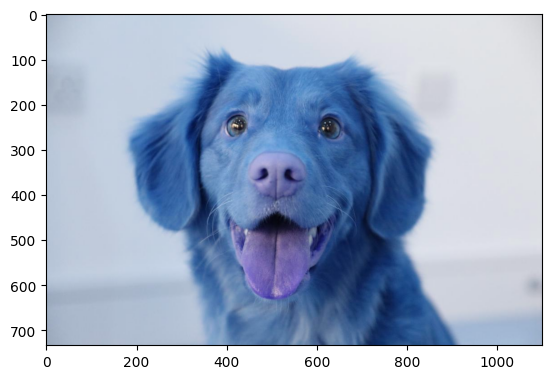

In [28]:
funny_dog = cv2.imread('img2.jpg')
plt.imshow(funny_dog)

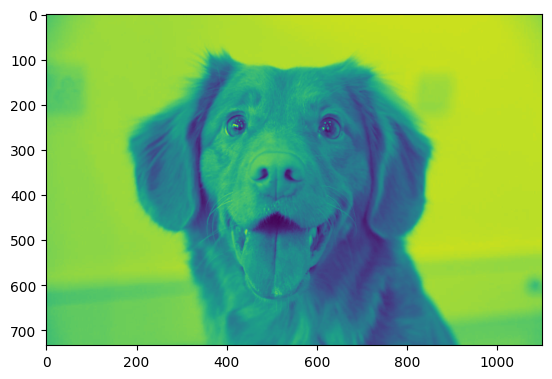

In [31]:
# Convert the image to grayscale
funny_dog_gray = cv2.cvtColor(funny_dog, cv2.COLOR_BGR2GRAY)
plt.imshow(funny_dog_gray)

In [36]:
# 1.1.1.1. Implement conv2d for grayscale images
def conv2d_gray(image, kernel):
    return signal.convolve2d(image, kernel, mode='same', boundary='symm')

# 1.1.1.2. Implement conv2d for color images
def conv2d_rgb(image, kernel):
    return np.dstack([conv2d_gray(image[:,:,i], kernel) for i in range(3)])

MSE for grayscale: 0.0
MSE for RGB: 0.0


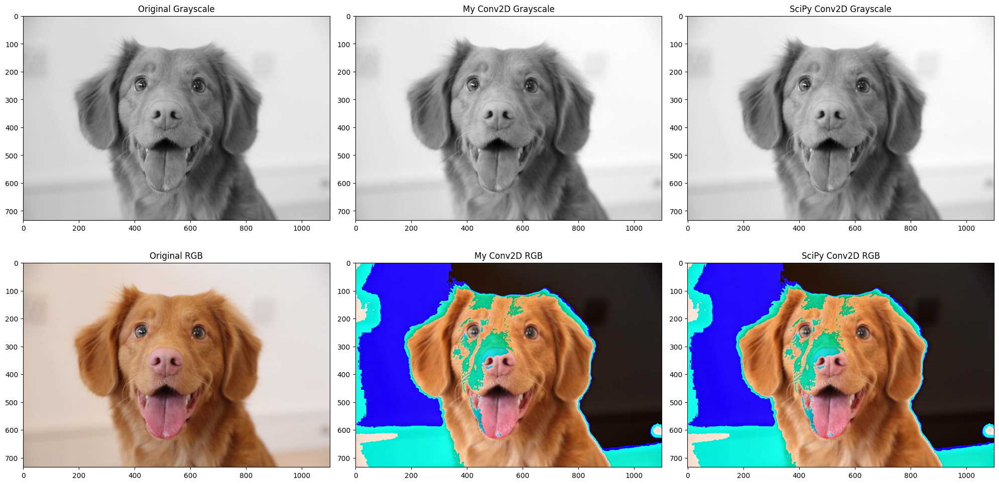

In [50]:
# Define a sample kernel
kernel = np.array((
	[7, 7, 7],
	[7, 7, 7],
	[7, 7, 7]), dtype="int") / 49

# Apply conv2d to grayscale image
result_gray = conv2d_gray(funny_dog_gray, kernel)

# Apply conv2d to color image
result_rgb = conv2d_rgb(funny_dog, kernel)

# 1.1.1.3. Compare with scipy's conv2d using MSE
scipy_result_gray = signal.convolve2d(funny_dog_gray, kernel, mode='same', boundary='symm')
scipy_result_rgb = np.dstack([signal.convolve2d(funny_dog[:,:,i], kernel, mode='same', boundary='symm') for i in range(3)])

mse_gray = mse(result_gray.flatten(), scipy_result_gray.flatten())
mse_rgb = mse(result_rgb.flatten(), scipy_result_rgb.flatten())

print(f"MSE for grayscale: {mse_gray}")
print(f"MSE for RGB: {mse_rgb}")

# Visualize results
plt.figure(figsize=(20, 10))

plt.subplot(231)
plt.imshow(funny_dog_gray, cmap='gray')
plt.title('Original Grayscale')

plt.subplot(232)
plt.imshow(result_gray, cmap='gray')
plt.title('My Conv2D Grayscale')

plt.subplot(233)
plt.imshow(scipy_result_gray, cmap='gray')
plt.title('SciPy Conv2D Grayscale')

plt.subplot(234)
plt.imshow(cv2.cvtColor(funny_dog, cv2.COLOR_BGR2RGB))
plt.title('Original RGB')

plt.subplot(235)
plt.imshow(cv2.cvtColor(result_rgb.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('My Conv2D RGB')

plt.subplot(236)
plt.imshow(cv2.cvtColor(scipy_result_rgb.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('SciPy Conv2D RGB')

plt.tight_layout()
plt.show()

# **2. LAB 2:**
  2.1. Gaussians as added Noise and as Filters.
  
      2.1.1. Implement a function to add Gaussian noise to an image. The prototype of the function should include image, the Gaussian noise expectation: μ, and the standard deviation  σ

      2.1.2. Using your function from above add a Gaussian noise to a meme of your choice. Make sure to convert your meme to grayscale before adding the noise use sigma, show 5 samples of noised image of sigma values in the range of [2,9].

      2.1.3. Implement a function to apply a filter you deem right to filter out the added Gaussian
      
      2.1.4. Use the function to filter out the noise you added in section 2.1.2
      
      2.1.5. Show a table compering the Standard deviation of the added noise and the standard deviation of the filter you used to filter out the nosie. Chose a fixed filter size you deem right.

  2.2. Implement a rotation function imrotate for a  grayscale image. The function prototype should include image and angle to rotate by in degrees. Loops are not allowed.  Hint:  np.meshgrid.
  
      2.2.1. Optional (but highly recommended) calculate the mapping from the  the output image indexes to the input images indexes using the inverse of the rotation matrix.

	    2.2.2. Compare you results using MSE to the results of cv2 image rotation.

  2.3. Optional: Implement a Zoom In / Zoom out. The Implementation should be similar to the implementation of the rotation function


*  2.1.1. Implement a function to add Gaussian noise to an image. The prototype of the function should include image, the Gaussian noise expectation: μ, and the standard deviation  σ



In [19]:
from numpy.random import MT19937, RandomState, SeedSequence

rs = RandomState(MT19937(SeedSequence(42))) #set seed
def add_guassian_noise(img: np.ndarray, mean: float, std_dev: float):
  # this function add gaussian noise to an im

  gaussian_noise = std_dev * rs.randn(*img.shape) + mean

  return img + gaussian_noise


In [3]:
!wget https://img.freepik.com/free-vector/simple-vibing-cat-square-meme_742173-4493.jpg -O meme.jpg

meme_img = cv2.imread('meme.jpg')
meme_img = cv2.cvtColor(meme_img, cv2.COLOR_BGR2GRAY).astype(np.float32)

--2024-07-08 11:35:23--  https://img.freepik.com/free-vector/simple-vibing-cat-square-meme_742173-4493.jpg
Resolving img.freepik.com (img.freepik.com)... 23.215.0.48, 23.215.0.45, 2600:1408:5400:5::170c:9027, ...
Connecting to img.freepik.com (img.freepik.com)|23.215.0.48|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 54640 (53K) [image/jpeg]
Saving to: ‘meme.jpg’

meme.jpg            100%[===================>]  53.36K  --.-KB/s    in 0.002s  

2024-07-08 11:35:23 (29.2 MB/s) - ‘meme.jpg’ saved [54640/54640]



*  2.1.2. Using your function from above add a Gaussian noise to a meme of your choice. Make sure to convert your meme to grayscale before adding the noise use sigma, show 5 samples of noised image of sigma values in the range of [2,9].

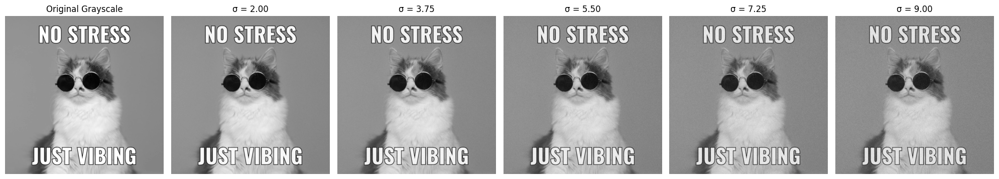

In [18]:
# Generate 5 noisy images with sigma values in the range [2, 9]
sigma_values = np.linspace(2, 9, 5)
noisy_images = [add_guassian_noise(meme_img, mean=0, std_dev=sigma) for sigma in sigma_values]

# Plot the results
plt.figure(figsize=(20, 4))

# Original grayscale image
plt.subplot(1, 6, 1)
plt.imshow(meme_img, cmap='gray')
plt.title('Original Grayscale')
plt.axis('off')

# Noisy images
for i, (noisy_img, sigma) in enumerate(zip(noisy_images, sigma_values)):
    plt.subplot(1, 6, i+2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title(f'σ = {sigma:.2f}')
    plt.axis('off')

plt.tight_layout()
plt.show()

*  2.1.3. Implement a function to apply a filter you deem right to filter out the added Gaussian


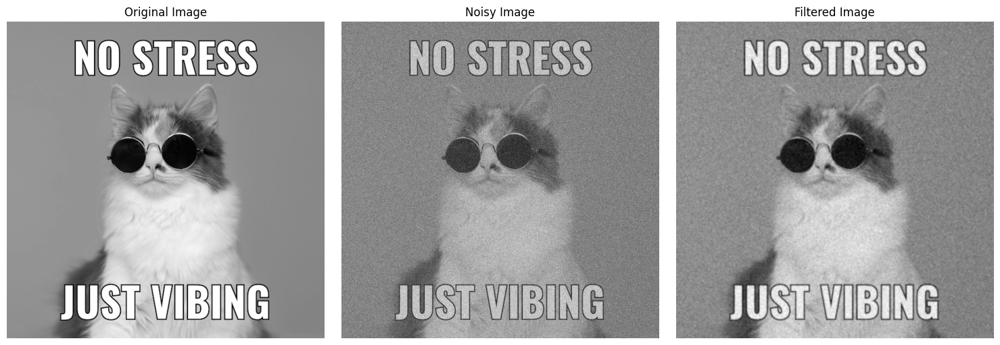

In [20]:
def apply_gaussian_filter(image, kernel_size=5, sigma=1):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)

noisy_image = add_guassian_noise(meme_img, mean=0, std_dev=25)
filtered_image = apply_gaussian_filter(noisy_image, kernel_size=5, sigma=1)

# Display results
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(meme_img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(noisy_image, cmap='gray')
plt.title('Noisy Image')
plt.axis('off')

plt.subplot(133)
plt.imshow(filtered_image, cmap='gray')
plt.title('Filtered Image')
plt.axis('off')

plt.tight_layout()
plt.show()

*  2.1.4. Use the function to filter out the noise you added in section 2.1.2

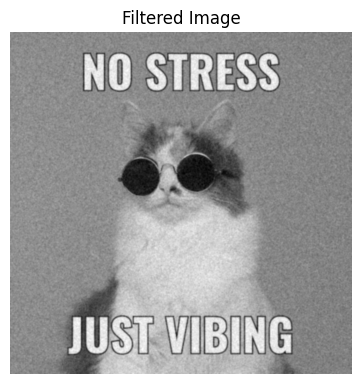

In [22]:
cleaned_img1 = cv2.GaussianBlur(filtered_image, (5, 5), 0)

plt.figure(figsize=(15, 5))

plt.subplot(133)
plt.imshow(filtered_image, cmap='gray')
plt.title('Filtered Image')
plt.axis('off')
plt.show()

  * 2.1.5. Show a table compering the Standard deviation of the added noise and the standard deviation of the filter you used to filter out the nosie. Chose a fixed filter size you deem right.


  Noise Std Dev    Best Filter Std Dev    PSNR (dB)
---------------  ---------------------  -----------
              5                   0.40        35.11
             10                   0.50        30.69
             15                   0.60        28.61
             20                   0.70        27.16
             25                   0.80        26.03
             30                   0.80        25.22


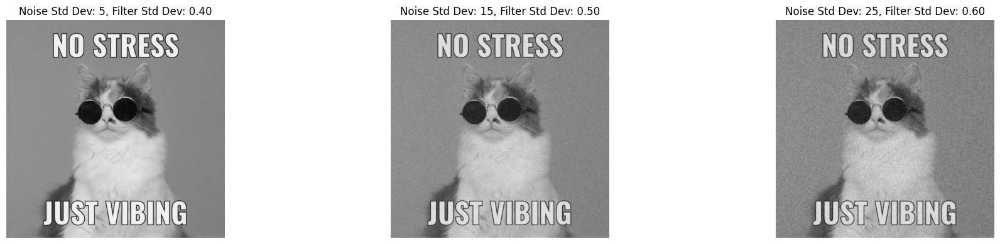

In [24]:
from tabulate import tabulate

# Fixed filter size
filter_size = 5

# Range of noise standard deviations to test
noise_std_devs = [5, 10, 15, 20, 25, 30]

# List to store results
results = []

for noise_std in noise_std_devs:
    # Add noise
    noisy_image = add_guassian_noise(meme_img, mean=0, std_dev=noise_std)

    # Find optimal filter sigma
    best_sigma = 0
    min_mse = float('inf')
    for sigma in np.linspace(0.1, 3, 30):
        filtered_image = apply_gaussian_filter(noisy_image, kernel_size=filter_size, sigma=sigma)
        mse = np.mean((filtered_image - meme_img)**2)
        if mse < min_mse:
            min_mse = mse
            best_sigma = sigma

    # Apply filter with best sigma
    filtered_image = apply_gaussian_filter(noisy_image, kernel_size=filter_size, sigma=best_sigma)

    # Calculate PSNR
    mse = np.mean((filtered_image - meme_img)**2)
    psnr = 10 * np.log10((255**2) / mse)

    results.append([noise_std, best_sigma, psnr])

# Create and display the table
headers = ["Noise Std Dev", "Best Filter Std Dev", "PSNR (dB)"]
print(tabulate(results, headers=headers, floatfmt=".2f"))

# Plot examples
plt.figure(figsize=(20, 4))
for i, noise_std in enumerate([5, 15, 25]):
    noisy_image = add_guassian_noise(meme_img, mean=0, std_dev=noise_std)
    filtered_image = apply_gaussian_filter(noisy_image, kernel_size=filter_size, sigma=results[i][1])

    plt.subplot(1, 3, i+1)
    plt.imshow(filtered_image, cmap='gray')
    plt.title(f'Noise Std Dev: {noise_std}, Filter Std Dev: {results[i][1]:.2f}')
    plt.axis('off')

plt.tight_layout()
plt.show()

* 2.2. Implement a rotation function imrotate for a grayscale image. The function prototype should include image and angle to rotate by in degrees. Loops are not allowed. Hint: np.meshgrid.

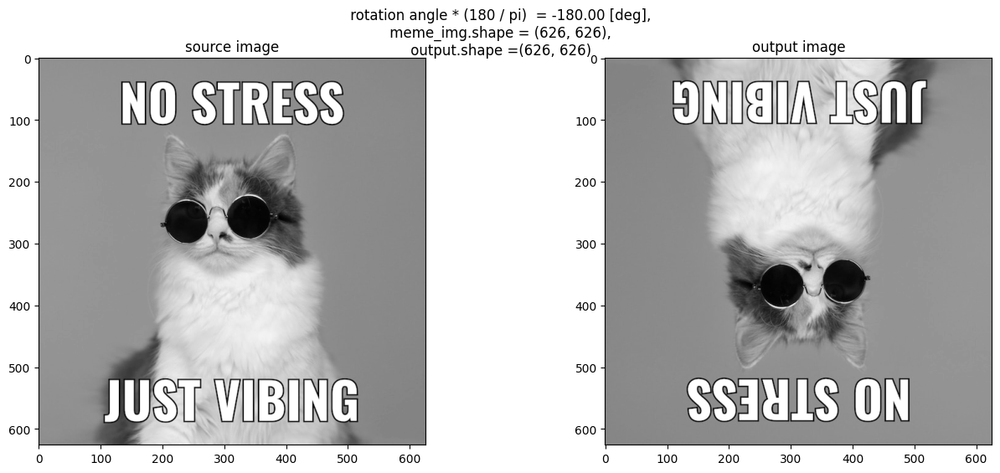

----------


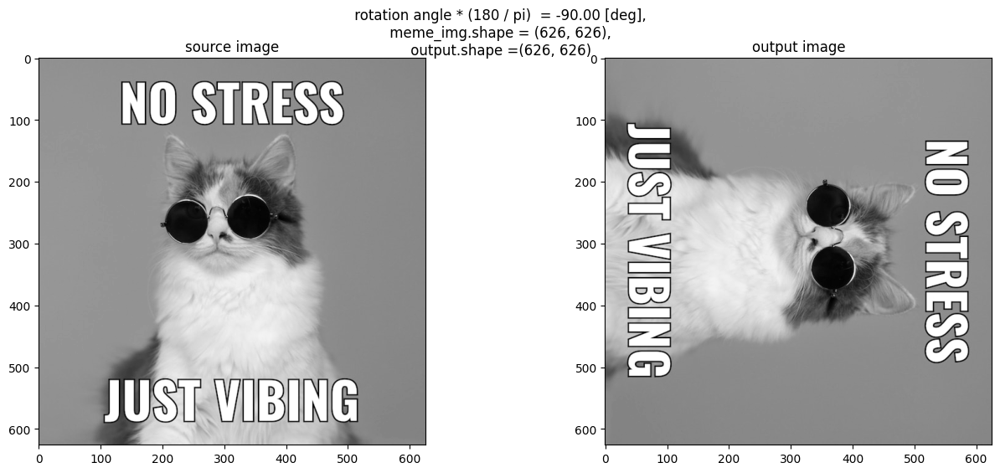

----------


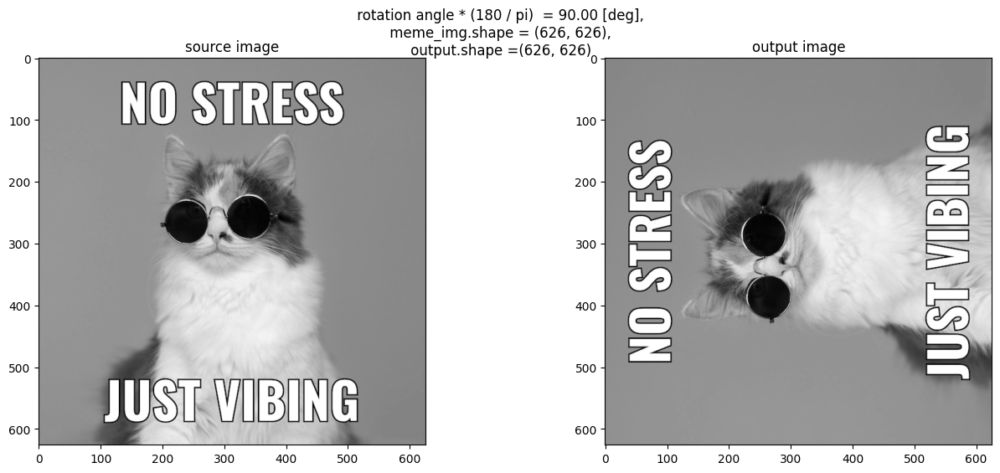

----------


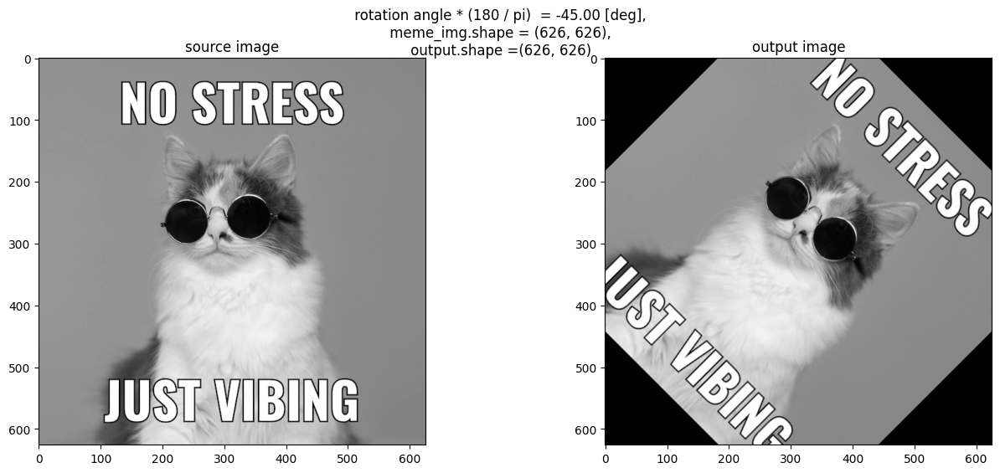

----------


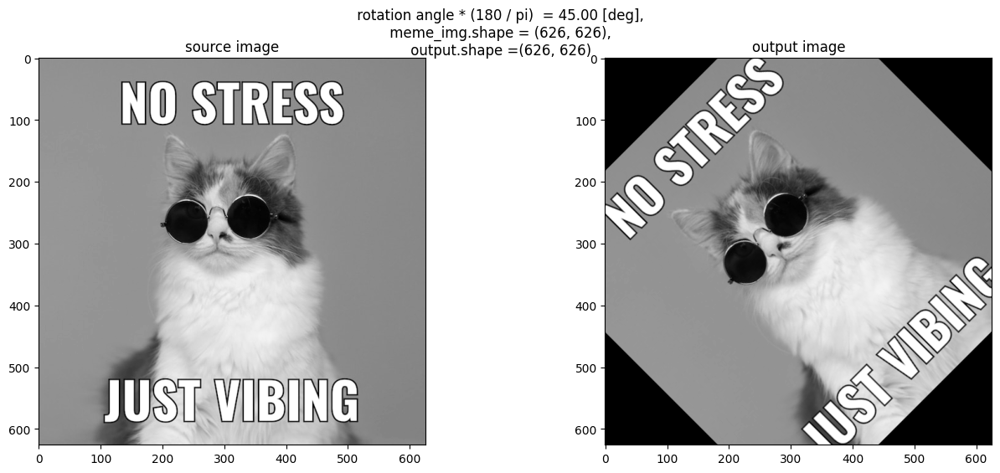

----------


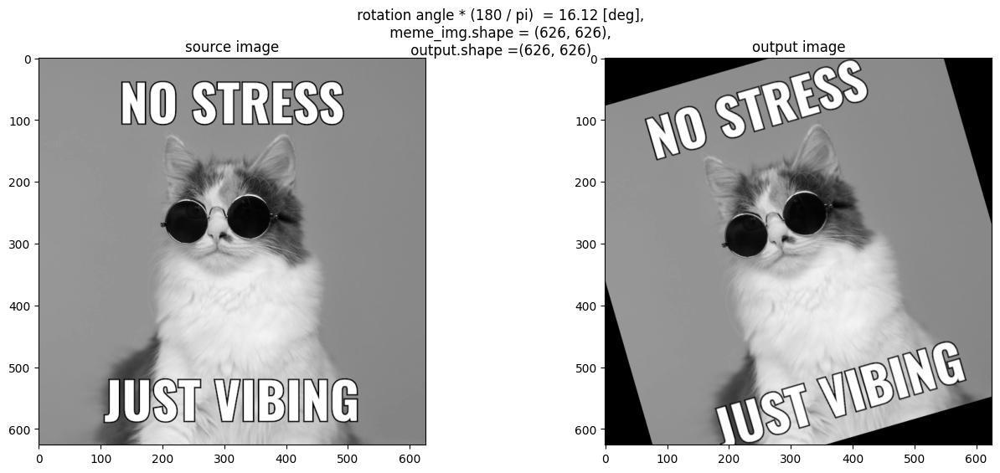

----------


In [27]:
def get_rot_matrix(theta):
  cos , sin = np.cos(theta), np.sin(theta)
  return np.array(([cos, -sin], [sin, cos]), dtype='float')



def rotate_image(img, angle):
    rot_mat = get_rot_matrix(angle)
    h, w = img.shape
    center_h, center_w = h / 2, w / 2
    mesh_w, mesh_h = np.meshgrid(np.arange(w), np.arange(h))

    # Apply rotate transformation
    new_coords = np.dot(rot_mat, np.array([mesh_w.ravel() - center_w, mesh_h.ravel() - center_h]))
    new_coords[0] += center_w
    new_coords[1] += center_h

    # Interpolate
    new_coords = new_coords.reshape(2, h, w)
    output = cv2.remap(img, new_coords[0].astype(np.float32), new_coords[1].astype(np.float32),
                       cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)

    return output



rotated_imgs = []
rot_angles = [-pi, -pi/2, pi/2, -pi/4, pi/4, 16.12 * pi/180 ]


for angle in rot_angles:
    rotated_imgs.append(rotate_image(meme_img, angle))


for angle, output in zip( rot_angles, rotated_imgs):
  plt.figure(figsize=(16, 6))
  plt.suptitle(f' rotation {angle * (180 / pi)  = :.2f} [deg],\n {meme_img.shape = },\n {output.shape =}')

  plt.subplot(121)
  plt.imshow(meme_img,'gray')
  plt.title('source image')
  plt.subplot(122)
  plt.imshow(output,'gray')
  plt.title('output image')
  plt.show()
  print('-'* 10)

* 2.2.2. Compare you results using MSE to the results of cv2 image rotation.

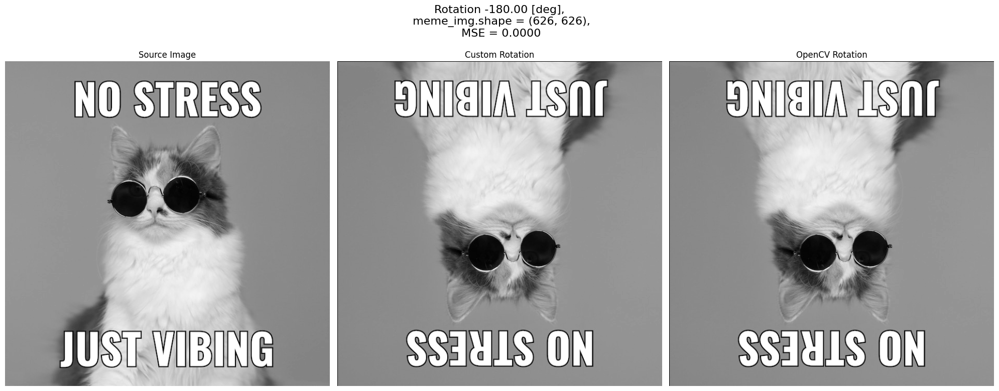

------------------------------


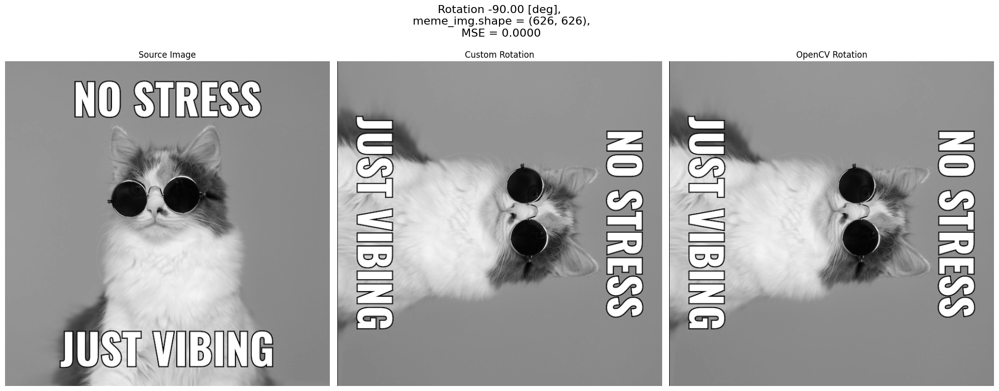

------------------------------


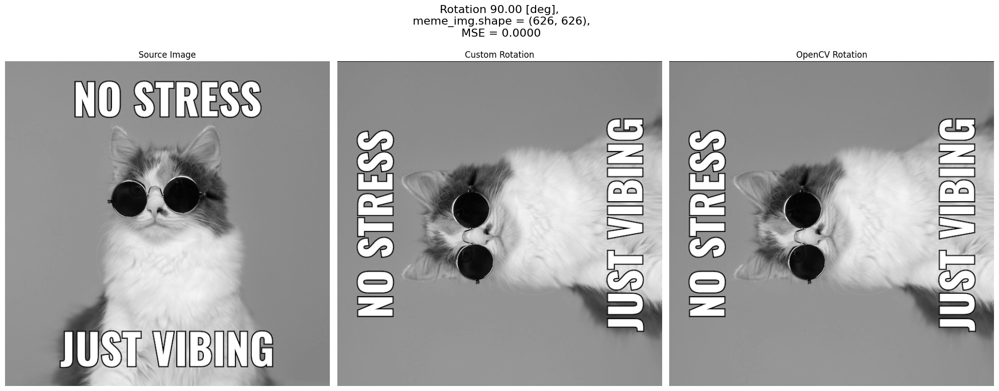

------------------------------


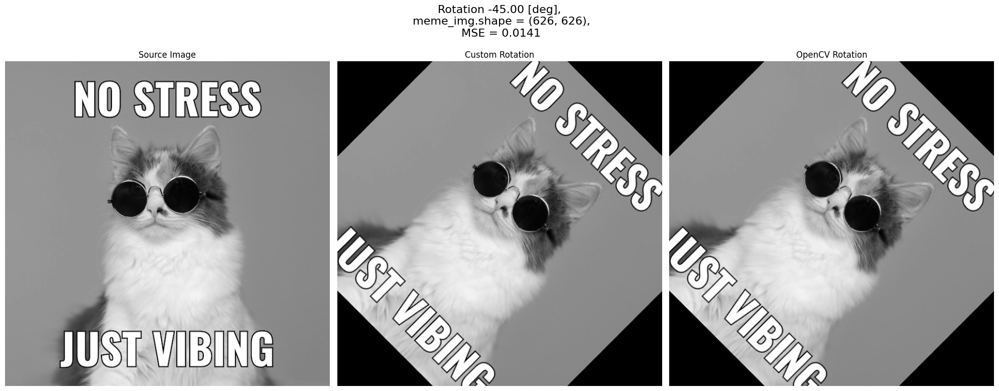

------------------------------


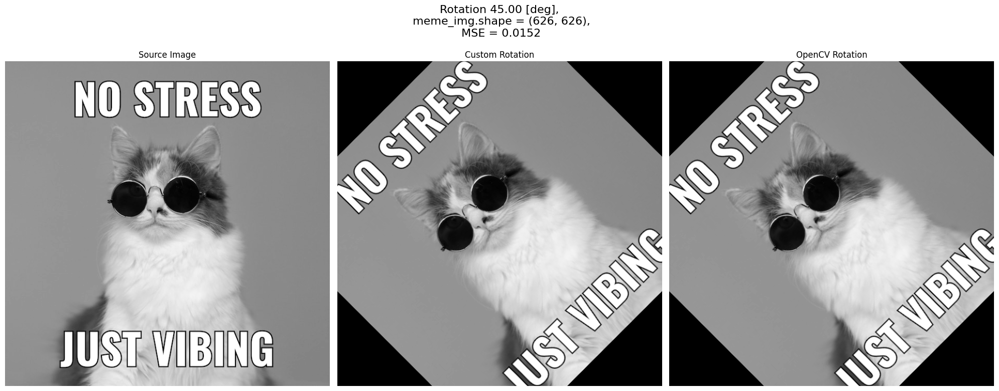

------------------------------


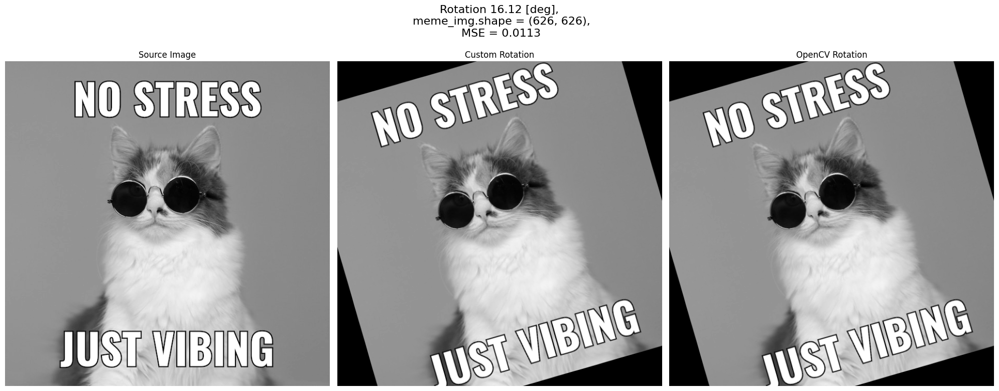

------------------------------


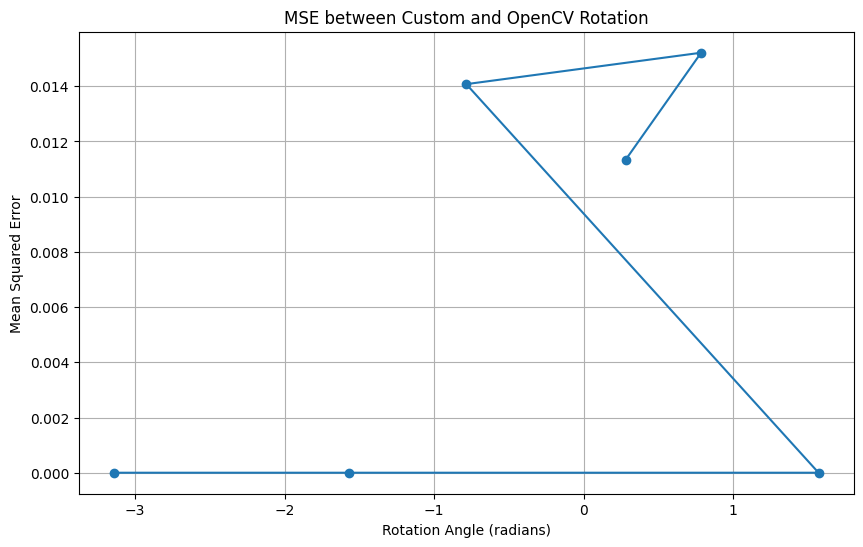

In [30]:
def cv2_rotate_image(img, angle):
    h, w = img.shape
    center = (w // 2, h // 2)
    rot_mat = cv2.getRotationMatrix2D(center, angle * 180 / pi, 1.0)
    return cv2.warpAffine(img, rot_mat, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)

def calculate_mse(img1, img2):
    return np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)

cv2_rotated_imgs = []
mse_values = []

for angle in rot_angles:
    cv2_rotated = cv2_rotate_image(meme_img, angle)
    cv2_rotated_imgs.append(cv2_rotated)
    myRotate = rotate_image(meme_img, angle)

    mse = calculate_mse(myRotate, cv2_rotated)
    mse_values.append(mse)

for angle, custom_output, cv2_output, mse in zip(rot_angles, rotated_imgs, cv2_rotated_imgs, mse_values):
    fig, axes = plt.subplots(1, 3, figsize=(20, 8))
    fig.suptitle(f'Rotation {angle * (180 / pi):.2f} [deg],\n {meme_img.shape = },\n MSE = {mse:.4f}', fontsize=16)

    axes[0].imshow(meme_img, 'gray')
    axes[0].set_title('Source Image')
    axes[0].axis('off')

    axes[1].imshow(custom_output, 'gray')
    axes[1].set_title('Custom Rotation')
    axes[1].axis('off')

    axes[2].imshow(cv2_output, 'gray')
    axes[2].set_title('OpenCV Rotation')
    axes[2].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # Adjust this value to create more space for the suptitle
    plt.show()
    print('-' * 30)

# Plot MSE values
plt.figure(figsize=(10, 6))
plt.plot(rot_angles, mse_values, marker='o')
plt.title('MSE between Custom and OpenCV Rotation')
plt.xlabel('Rotation Angle (radians)')
plt.ylabel('Mean Squared Error')
plt.grid(True)
plt.show()

  * 2.3. Optional: Implement a Zoom In / Zoom out. The Implementation should be similar to the implementation of the rotation function


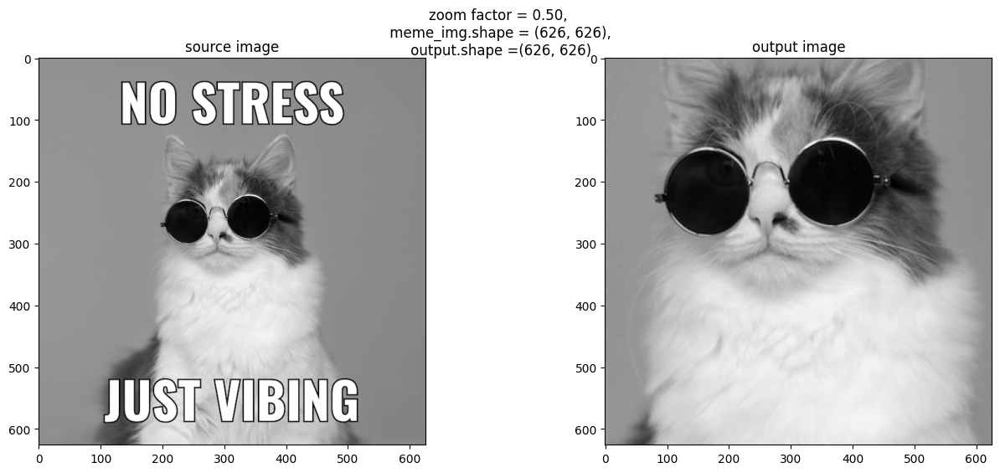

----------


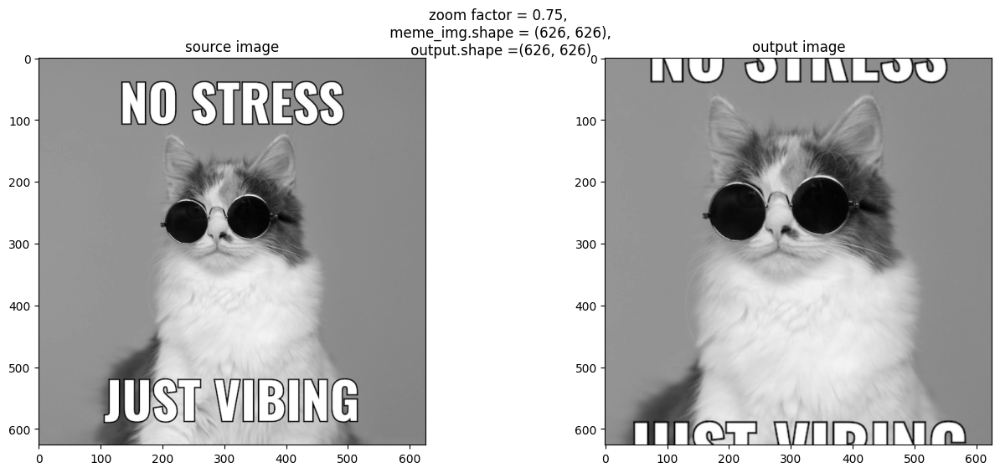

----------


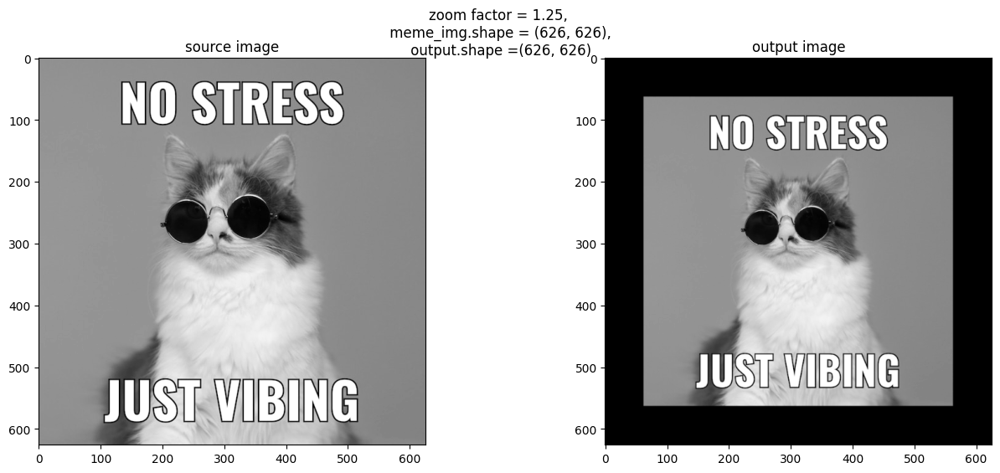

----------


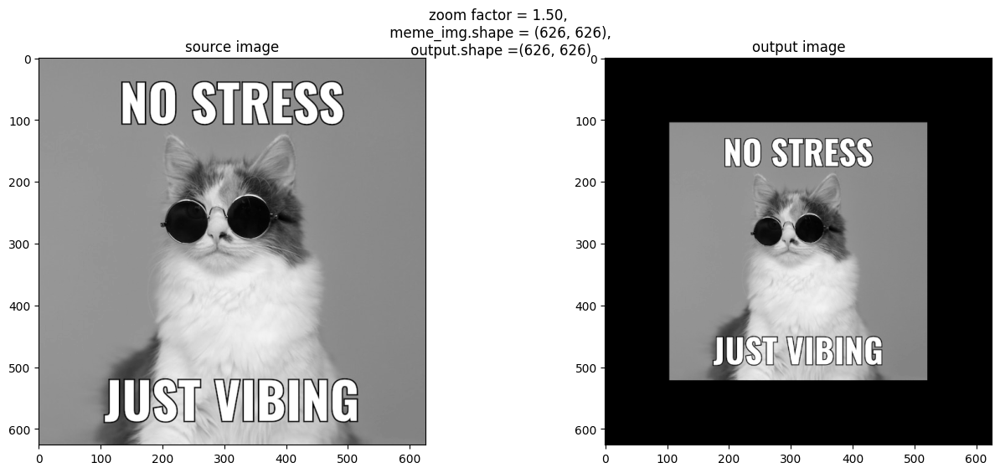

----------


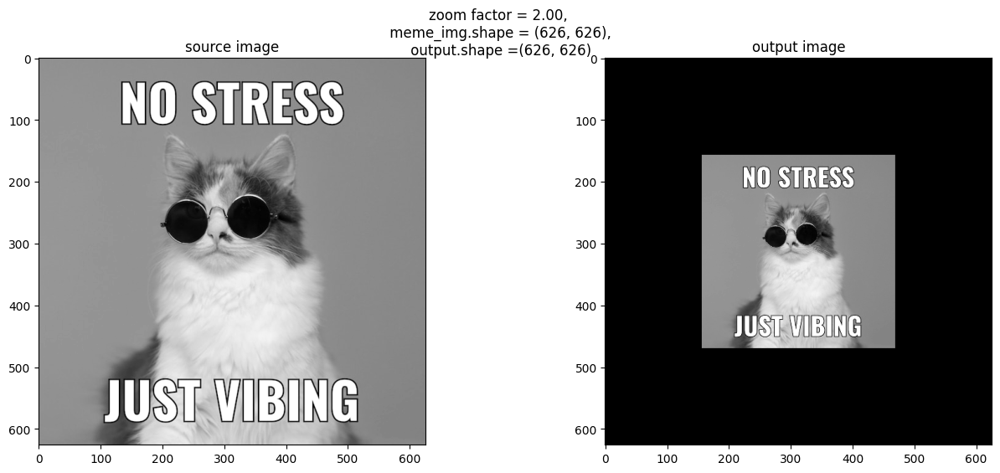

----------


In [26]:
from math import pi

def get_zoom_matrix(zoom_factor):
    return np.array(([zoom_factor, 0], [0, zoom_factor]), dtype='float')

def zoom_image(img, zoom_factor):
    zoom_mat = get_zoom_matrix(zoom_factor)
    h, w = img.shape
    center_h, center_w = h / 2, w / 2
    mesh_w, mesh_h = np.meshgrid(np.arange(w), np.arange(h))

    # Apply zoom transformation
    new_coords = np.dot(zoom_mat, np.array([mesh_w.ravel() - center_w, mesh_h.ravel() - center_h]))
    new_coords[0] += center_w
    new_coords[1] += center_h

    # Interpolate
    new_coords = new_coords.reshape(2, h, w)
    output = cv2.remap(img, new_coords[0].astype(np.float32), new_coords[1].astype(np.float32),
                       cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)

    return output

zoomed_imgs = []
zoom_factors = [0.5, 0.75, 1.25, 1.5, 2]

for factor in zoom_factors:
    zoomed_imgs.append(zoom_image(meme_img, factor))

for factor, output in zip(zoom_factors, zoomed_imgs):
    plt.figure(figsize=(16, 6))
    plt.suptitle(f'zoom factor = {factor:.2f},\n {meme_img.shape = },\n {output.shape =}')
    plt.subplot(121)
    plt.imshow(meme_img, 'gray')
    plt.title('source image')
    plt.subplot(122)
    plt.imshow(output, 'gray')
    plt.title('output image')
    plt.show()
    print('-'* 10)